In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib
matplotlib.rcParams['figure.dpi'] = 600

In [2]:
def quad_conversion(quad_input):
    mapping = np.array([52, 60, 61, 53, 50, 58, 59, 51, 48, 56, 57, 49, 38, 46, 47, 39,\
                        22, 30, 31, 23,  6, 14, 15,  7, 36, 44, 45, 37, 20, 28, 29, 21,\
                         4, 12, 13,  5, 34, 42, 43, 35, 18, 26, 27, 19,  2, 10, 11,  3,\
                        32, 40, 41, 33, 16, 24, 25, 17,  0,  8,  9,  1])
    quad_output = np.zeros(64)
    for i in range(60):
        quad_output[mapping[i]] = quad_input[i]
    return quad_output

In [3]:
def pixel_to_quad(pixel_input):
    pixel = pixel_input.copy().reshape(32,32)
    quad = np.zeros((8,8))
    for j in range(8):
        for k in range(8):
            quad[j,k] = pixel[(4*j):(4*j+4),(4*k):(4*k+4)].sum()
    quad = quad.reshape(64)
    return quad

def pixel_to_pmt(pixel_input):
    pixel = pixel_input.copy().reshape(32,32)
    pmt = np.zeros((4,4))
    for j in range(4):
        for k in range(4):
            pmt[j,k] = pixel[(8*j):(8*j+8),(8*k):(8*k+8)].sum()
    pmt = pmt.reshape(16)
    return pmt

def quad_to_pmt(quad_input):
    quad = quad_input.copy().reshape(8,8)
    pmt = np.zeros((4,4))
    for j in range(4):
        for k in range(4):
            pmt[j,k] = quad[(2*j):(2*j+2),(2*k):(2*k+2)].sum()
    pmt = pmt.reshape(16)
    return pmt

In [4]:
from scipy.optimize import curve_fit

def gaussian(x, A, mu, sigma):
    return A*np.exp(-(x-mu)**2/(2*sigma**2))

def gaussian_fit(x_array, y_array):
    A = max(y_array)
    mu = sum(x_array*y_array)/sum(y_array)
    sigma = np.sqrt(sum(y_array*(x_array-mu)**2)/sum(y_array))
    popt,pcov = curve_fit(gaussian, x_array, y_array, p0=[A, mu,sigma])
    return popt

## train, npe, LED, maroc/pixel readout

In [5]:
def train_npe_led_pixel(input_name):
    file_input = open(input_name)
    npe = np.empty(0)
    
    line = file_input.readline()
    while(line):
        hit = np.fromstring(line, sep="\t", dtype=int)[1:]
        pixel = np.zeros(1024)
        pixel[hit] = 1
        quad = pixel_to_quad(pixel)
        pmt = pixel_to_pmt(pixel)
        results = np.array([pixel.nonzero()[0].size, quad.nonzero()[0].size, pmt.nonzero()[0].size])
        
        if npe.size>0:
            npe = np.vstack((npe, results))
        else:
            npe = results
        line = file_input.readline()
        
    file_input.close()
    return npe

In [6]:
npe_led_pixel_sigraw1 = train_npe_led_pixel("data/benchtest/pixel/signalLED_run1_pixel_new.ml")
npe_led_pixel_sigraw2 = train_npe_led_pixel("data/benchtest/pixel/signalLED_run2336_pixel.ml")
npe_led_pixel_sig65 = train_npe_led_pixel("data/benchtest/pixel/signalLED_bgLED_run1_pixel.ml")
npe_led_pixel_sig180 = train_npe_led_pixel("data/benchtest/pixel/signalLED_bgLED180_run2339_pixel.ml")
npe_led_pixel_sig370 = train_npe_led_pixel("data/benchtest/pixel/signalLED_bgLED370_run2337_pixel.ml")
npe_led_pixel_bkg65 = train_npe_led_pixel("data/benchtest/pixel/bgLED_run1_pixel.ml")
npe_led_pixel_bkg180 = train_npe_led_pixel("data/benchtest/pixel/bgLED_180_run2345_pixel_LED.ml")
npe_led_pixel_bkg370 = train_npe_led_pixel("data/benchtest/pixel/bgLED_370_run2369_pixel_LED.ml")

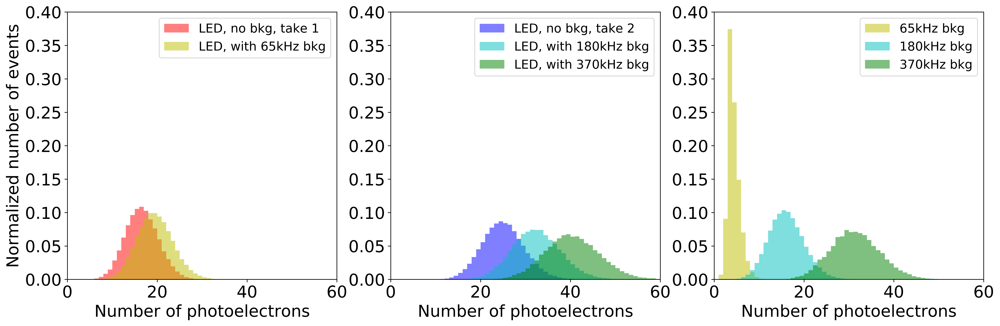

In [9]:
fig, axs = plt.subplots(1,3,figsize=(20,6))
        
hist_led_pixel_sigraw1 = axs[0].hist(npe_led_pixel_sigraw1[:,0], bins=np.arange(60), alpha=0.5, density=True, color='r', label='LED, no bkg, take 1')
hist_led_pixel_sig65 = axs[0].hist(npe_led_pixel_sig65[:,0], bins=np.arange(60), alpha=0.5, density=True, color='y', label='LED, with 65kHz bkg')

hist_led_pixel_sigraw2 = axs[1].hist(npe_led_pixel_sigraw2[:,0], bins=np.arange(60), alpha=0.5, density=True, color='b', label='LED, no bkg, take 2')
hist_led_pixel_sig180 = axs[1].hist(npe_led_pixel_sig180[:,0], bins=np.arange(60), alpha=0.5, density=True, color='c', label='LED, with 180kHz bkg')
hist_led_pixel_sig370 = axs[1].hist(npe_led_pixel_sig370[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='LED, with 370kHz bkg')

hist_led_pixel_bkg65 = axs[2].hist(npe_led_pixel_bkg65[:,0], bins=np.arange(60), alpha=0.5, density=True, color='y', label='65kHz bkg')
hist_led_pixel_bkg180 = axs[2].hist(npe_led_pixel_bkg180[:,0], bins=np.arange(60), alpha=0.5, density=True, color='c', label='180kHz bkg')
hist_led_pixel_bkg370 = axs[2].hist(npe_led_pixel_bkg370[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='370kHz bkg')

for i in range(3):
    axs[i].legend(fontsize=15)
    axs[i].set_xlabel("Number of photoelectrons",fontsize=20)
    axs[0].set_ylabel("Normalized number of events",fontsize=20)
    axs[i].set_xlim([0,60])
    axs[i].set_ylim([0,0.4])
    axs[i].tick_params(labelsize=20)
plt.savefig('npe_led_pixel_dist.png')

In [10]:
fig, axs = plt.subplots(2,3,figsize=(20,10))

hist_led_pixel_sig65 = axs[0,0].hist(npe_led_pixel_sig65[:,0], bins=np.arange(60), alpha=0.5, density=True, color='b', label='LED, with 65kHz bkg')
hist_led_pixel_bkg65 = axs[0,0].hist(npe_led_pixel_bkg65[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='65kHz bkg')

hist_led_pixel_sig180 = axs[0,1].hist(npe_led_pixel_sig180[:,0], bins=np.arange(60), alpha=0.5, density=True, color='b', label='LED, with 180kHz bkg')
hist_led_pixel_bkg180 = axs[0,1].hist(npe_led_pixel_bkg180[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='180kHz bkg')

hist_led_pixel_sig370 = axs[0,2].hist(npe_led_pixel_sig370[:,0], bins=np.arange(60), alpha=0.5, density=True, color='b', label='LED, with 370kHz bkg')
hist_led_pixel_bkg370 = axs[0,2].hist(npe_led_pixel_bkg370[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='370kHz bkg')

axs[1,0].plot(1-np.cumsum(hist_led_pixel_sig65[0]),color='b', label='LED signal, with 65kHz bkg')
axs[1,0].plot(np.cumsum(hist_led_pixel_bkg65[0]),color='g', label='65kHz bkg')
axs[1,0].scatter(8.5,1, color='r', label="100%")

axs[1,1].plot(1-np.cumsum(hist_led_pixel_sig180[0]),color='b', label='LED signal, with 180kHz bkg')
axs[1,1].plot(np.cumsum(hist_led_pixel_bkg180[0]),color='g', label='180kHz bkg')
axs[1,1].scatter(22,0.96, color='r', label="96%")

axs[1,2].plot(1-np.cumsum(hist_led_pixel_sig370[0]),color='b', label='LED signal, with 370kHz bkg')
axs[1,2].plot(np.cumsum(hist_led_pixel_bkg370[0]),color='g', label='370kHz bkg')
axs[1,2].scatter(34.5,0.785, color='r', label="78.5%")

#fig.suptitle("NPE cut, LED ring signal, pixel readout",fontsize=20)
for i in range(3):
    axs[0,i].legend(fontsize=15)
    axs[0,i].set_xlabel("Number of photoelectrons",fontsize=20)
    axs[0,0].set_ylabel("Normalized number of events",fontsize=20)
    axs[0,i].set_xlim([0,60])
    axs[0,i].set_ylim([0,0.4])
    axs[0,i].tick_params(labelsize=20)
for i in range(3):
    axs[1,i].legend(fontsize=15)
    axs[1,i].set_xlabel("NPE cut",fontsize=20)
    axs[1,0].set_ylabel("Accuracy",fontsize=20)
    axs[1,i].set_xlim([0,60])
    axs[1,i].set_ylim([0,1])
    axs[1,i].tick_params(labelsize=20)
plt.savefig('npe_led_pixel_accuracy.png')

## train, npe, LED, fadc/quad readout

In [6]:
def train_npe_led_quad(input_name):
    file_input = open(input_name)
    npe = np.empty(0)
    
    line = file_input.readline()
    while(line):
        quad = quad_conversion(np.fromstring(line, sep="\t",dtype=float)[1:])
        pmt = quad_to_pmt(quad)
        results = np.array([quad.sum(), quad.nonzero()[0].size, pmt.nonzero()[0].size])
        
        if npe.size>0:
            npe = np.vstack((npe, results))
        else:
            npe = results
        line = file_input.readline()
        
    file_input.close()
    return npe

In [12]:
npe_led_quad_sigraw2 = train_npe_led_quad("data/benchtest/fadc/signalLED_run2336_fadc.ml")
npe_led_quad_sig65 = train_npe_led_quad("data/benchtest/fadc/signalLED_bgLED65_run1_fadc.ml")
npe_led_quad_sig180 = train_npe_led_quad("data/benchtest/fadc/signalLED_bgLED180_run2339_fadc.ml")
npe_led_quad_sig370 = train_npe_led_quad("data/benchtest/fadc/signalLED_bgLED370_run2337_fadc.ml")
npe_led_quad_bkg65 = train_npe_led_quad("data/benchtest/fadc/bgLED_run165_fadc_LED.ml")
npe_led_quad_bkg180 = train_npe_led_quad("data/benchtest/fadc/bgLED_180_run2345_fadc_LED.ml")
npe_led_quad_bkg370 = train_npe_led_quad("data/benchtest/fadc/bgLED_370_run2369_fadc_LED.ml")

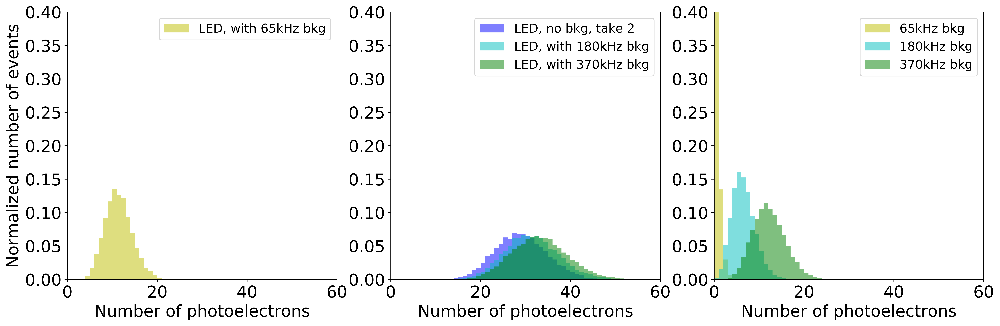

In [13]:
fig, axs = plt.subplots(1,3,figsize=(20,6))
        
hist_led_quad_sig65 = axs[0].hist(npe_led_quad_sig65[:,0], bins=np.arange(60), alpha=0.5, density=True, color='y', label='LED, with 65kHz bkg')

hist_led_quad_sigraw2 = axs[1].hist(npe_led_quad_sigraw2[:,0], bins=np.arange(60), alpha=0.5, density=True, color='b', label='LED, no bkg, take 2')
hist_led_quad_sig180 = axs[1].hist(npe_led_quad_sig180[:,0], bins=np.arange(60), alpha=0.5, density=True, color='c', label='LED, with 180kHz bkg')
hist_led_quad_sig370 = axs[1].hist(npe_led_quad_sig370[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='LED, with 370kHz bkg')

hist_led_quad_bkg65 = axs[2].hist(npe_led_quad_bkg65[:,0], bins=np.arange(60), alpha=0.5, density=True, color='y', label='65kHz bkg')
hist_led_quad_bkg180 = axs[2].hist(npe_led_quad_bkg180[:,0], bins=np.arange(60), alpha=0.5, density=True, color='c', label='180kHz bkg')
hist_led_quad_bkg370 = axs[2].hist(npe_led_quad_bkg370[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='370kHz bkg')

#fig.suptitle("NPE distribution, LED ring signal, quad readout",fontsize=20)
for i in range(3):
    axs[i].legend(fontsize=15)
    axs[i].set_xlabel("Number of photoelectrons",fontsize=20)
    axs[0].set_ylabel("Normalized number of events",fontsize=20)
    axs[i].set_xlim([0,60])
    axs[i].set_ylim([0,0.4])
    axs[i].tick_params(labelsize=20)
plt.savefig('npe_led_quad_dist.png')

In [14]:
fig, axs = plt.subplots(2,3,figsize=(20,10))

hist_led_quad_sig65 = axs[0,0].hist(npe_led_quad_sig65[:,0], bins=np.arange(60), alpha=0.5, density=True, color='b', label='LED, with 65kHz bkg')
hist_led_quad_bkg65 = axs[0,0].hist(npe_led_quad_bkg65[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='65kHz bkg')

hist_led_quad_sig180 = axs[0,1].hist(npe_led_quad_sig180[:,0], bins=np.arange(60), alpha=0.5, density=True, color='b', label='LED, with 180kHz bkg')
hist_led_quad_bkg180 = axs[0,1].hist(npe_led_quad_bkg180[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='180kHz bkg')

hist_led_quad_sig370 = axs[0,2].hist(npe_led_quad_sig370[:,0], bins=np.arange(60), alpha=0.5, density=True, color='b', label='LED, with 370kHz bkg')
hist_led_quad_bkg370 = axs[0,2].hist(npe_led_quad_bkg370[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='370kHz bkg')

axs[1,0].plot(1-np.cumsum(hist_led_quad_sig65[0]),color='b', label='LED signal, with 65kHz bkg')
axs[1,0].plot(np.cumsum(hist_led_quad_bkg65[0]),color='g', label='65kHz bkg')
axs[1,0].scatter(3,1, color='r', label="100%")

axs[1,1].plot(1-np.cumsum(hist_led_quad_sig180[0]),color='b', label='LED signal, with 180kHz bkg')
axs[1,1].plot(np.cumsum(hist_led_quad_bkg180[0]),color='g', label='180kHz bkg')
axs[1,1].scatter(15,1, color='r', label="100%")

axs[1,2].plot(1-np.cumsum(hist_led_quad_sig370[0]),color='b', label='LED signal, with 370kHz bkg')
axs[1,2].plot(np.cumsum(hist_led_quad_bkg370[0]),color='g', label='370kHz bkg')
axs[1,2].scatter(19.75,0.985, color='r', label="98.5%")

#fig.suptitle("NPE cut, LED ring signal, quad readout",fontsize=20)
for i in range(3):
    axs[0,i].legend(fontsize=15)
    axs[0,i].set_xlabel("Number of photoelectrons",fontsize=20)
    axs[0,0].set_ylabel("Normalized number of events",fontsize=20)
    axs[0,i].set_xlim([0,60])
    axs[0,i].set_ylim([0,0.4])
    axs[0,i].tick_params(labelsize=20)
for i in range(3):
    axs[1,i].legend(fontsize=15)
    axs[1,i].set_xlabel("NPE cut",fontsize=20)
    axs[1,0].set_ylabel("Accuracy",fontsize=20)
    axs[1,i].set_xlim([0,60])
    axs[1,i].set_ylim([0,1])
    axs[1,i].tick_params(labelsize=20)
plt.savefig('npe_led_quad_accuracy.png')

In [7]:
npe_led_quad_sig180_80ns = train_npe_led_quad("data/benchtest/fadc_80ns/signalLED_bgLED180_run2339_fadc.ml")
npe_led_quad_sig370_80ns = train_npe_led_quad("data/benchtest/fadc_80ns/signalLED_bgLED370_run2337_fadc.ml")
npe_led_quad_bkg180_80ns = train_npe_led_quad("data/benchtest/fadc_80ns/bgLED_180_run2345_fadc_LED.ml")
npe_led_quad_bkg370_80ns = train_npe_led_quad("data/benchtest/fadc_80ns/bgLED_370_run2369_fadc_LED.ml")

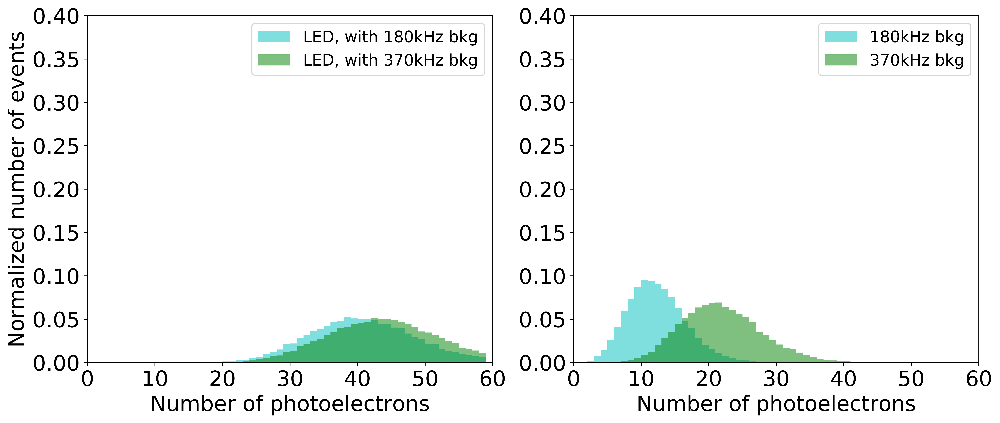

In [8]:
fig, axs = plt.subplots(1,2,figsize=(15,6))

hist_led_quad_sig180_80ns = axs[0].hist(npe_led_quad_sig180_80ns[:,0], bins=np.arange(60), alpha=0.5, density=True, color='c', label='LED, with 180kHz bkg')
hist_led_quad_sig370_80ns = axs[0].hist(npe_led_quad_sig370_80ns[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='LED, with 370kHz bkg')

hist_led_quad_bkg180_80ns = axs[1].hist(npe_led_quad_bkg180_80ns[:,0], bins=np.arange(60), alpha=0.5, density=True, color='c', label='180kHz bkg')
hist_led_quad_bkg370_80ns = axs[1].hist(npe_led_quad_bkg370_80ns[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='370kHz bkg')

#fig.suptitle("NPE distribution, LED ring signal, quad readout",fontsize=20)
for i in range(2):
    axs[i].legend(fontsize=15)
    axs[i].set_xlabel("Number of photoelectrons",fontsize=20)
    axs[0].set_ylabel("Normalized number of events",fontsize=20)
    axs[i].set_xlim([0,60])
    axs[i].set_ylim([0,0.4])
    axs[i].tick_params(labelsize=20)
plt.savefig('npe_led_quad_dist.png')

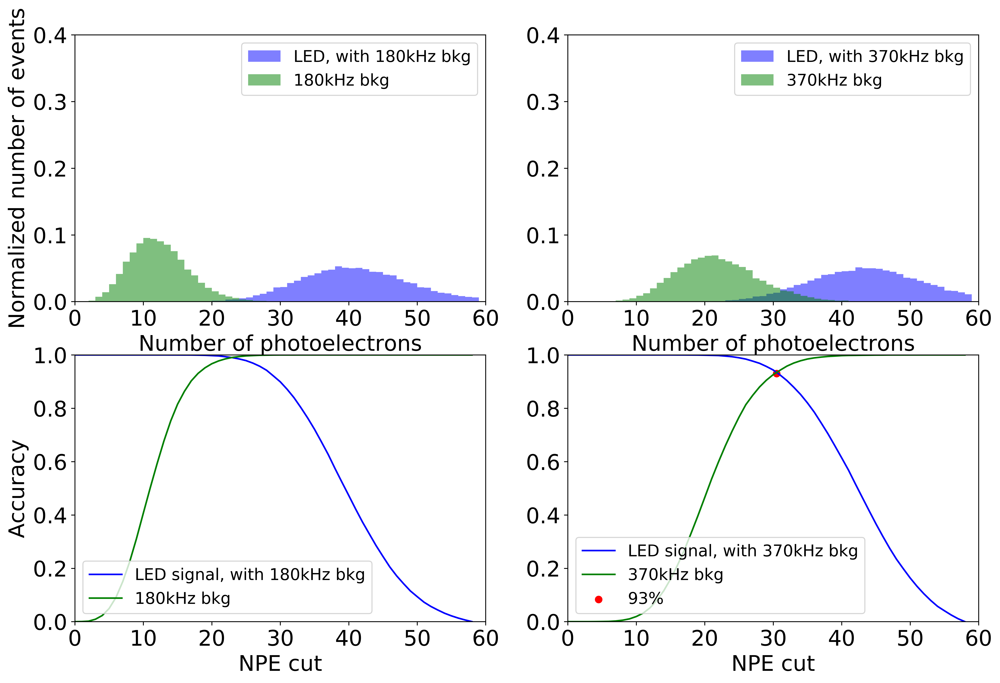

In [18]:
fig, axs = plt.subplots(2,2,figsize=(15,10))

hist_led_quad_sig180_80ns = axs[0,0].hist(npe_led_quad_sig180_80ns[:,0], bins=np.arange(60), alpha=0.5, density=True, color='b', label='LED, with 180kHz bkg')
hist_led_quad_bkg180_80ns = axs[0,0].hist(npe_led_quad_bkg180_80ns[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='180kHz bkg')

hist_led_quad_sig370_80ns = axs[0,1].hist(npe_led_quad_sig370_80ns[:,0], bins=np.arange(60), alpha=0.5, density=True, color='b', label='LED, with 370kHz bkg')
hist_led_quad_bkg370_80ns = axs[0,1].hist(npe_led_quad_bkg370_80ns[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='370kHz bkg')

axs[1,0].plot(1-np.cumsum(hist_led_quad_sig180_80ns[0]),color='b', label='LED signal, with 180kHz bkg')
axs[1,0].plot(np.cumsum(hist_led_quad_bkg180_80ns[0]),color='g', label='180kHz bkg')
#axs[1,0].scatter(3,1, color='r', label="100%")

axs[1,1].plot(1-np.cumsum(hist_led_quad_sig370_80ns[0]),color='b', label='LED signal, with 370kHz bkg')
axs[1,1].plot(np.cumsum(hist_led_quad_bkg370_80ns[0]),color='g', label='370kHz bkg')
axs[1,1].scatter(30.5,0.93, color='r', label="93%")

#axs[1,2].plot(1-np.cumsum(hist_led_quad_sig370[0]),color='b', label='LED signal, with 370kHz bkg')
#axs[1,2].plot(np.cumsum(hist_led_quad_bkg370[0]),color='g', label='370kHz bkg')
#axs[1,2].scatter(19.75,0.985, color='r', label="98.5%")

#fig.suptitle("NPE cut, LED ring signal, quad readout",fontsize=20)
for i in range(2):
    axs[0,i].legend(fontsize=15)
    axs[0,i].set_xlabel("Number of photoelectrons",fontsize=20)
    axs[0,0].set_ylabel("Normalized number of events",fontsize=20)
    axs[0,i].set_xlim([0,60])
    axs[0,i].set_ylim([0,0.4])
    axs[0,i].tick_params(labelsize=20)
for i in range(2):
    axs[1,i].legend(fontsize=15)
    axs[1,i].set_xlabel("NPE cut",fontsize=20)
    axs[1,0].set_ylabel("Accuracy",fontsize=20)
    axs[1,i].set_xlim([0,60])
    axs[1,i].set_ylim([0,1])
    axs[1,i].tick_params(labelsize=20)
#plt.savefig('npe_led_quad_accuracy.png')

## train, npe, cosmic, maroc/pixel readout

In [15]:
def train_npe_cos_pixel(input_name):
    file_input = open(input_name)
    npe = np.empty(0)
    
    line = file_input.readline()
    while(line):
        hit = np.fromstring(line, sep="\t", dtype=int)[1:]
        pixel = np.zeros(1024)
        pixel[hit] = 1
        quad = pixel_to_quad(pixel)
        pmt = pixel_to_pmt(pixel)
        results = np.array([pixel.nonzero()[0].size, quad.nonzero()[0].size, pmt.nonzero()[0].size])
        
        if npe.size>0:
            npe = np.vstack((npe, results))
        else:
            npe = results
        line = file_input.readline()
        
    file_input.close()
    return npe

old setting

In [16]:
npe_cos_pixel_sigraw_old = train_npe_cos_pixel("data/benchtest/pixel/lucite_run1_pixel.ml")
npe_cos_pixel_sig65_old = train_npe_cos_pixel("data/benchtest/pixel/lucite_bgLED_run1_pixel.ml")
npe_cos_pixel_sig140_old = train_npe_cos_pixel("data/benchtest/pixel/lucite_run2_140khz_pixel.ml")
npe_cos_pixel_sig200_old = train_npe_cos_pixel("data/benchtest/pixel/lucite_run3_200khz_pixel.ml")
npe_cos_pixel_bkg65_old = train_npe_cos_pixel("data/benchtest/pixel/bgLED_run1_pixel.ml")
npe_cos_pixel_bkg140_old = train_npe_cos_pixel("data/benchtest/pixel/bgLED_140_run2365_pixel_cosmic.ml")
npe_cos_pixel_bkg200_old = train_npe_cos_pixel("data/benchtest/pixel/bgLED_200_run2383_pixel_cosmic.ml")

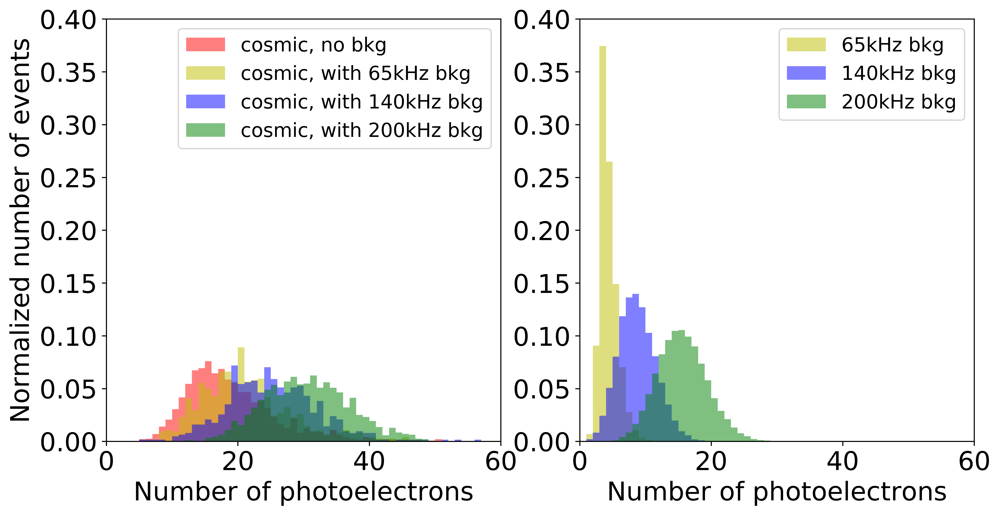

In [17]:
fig, axs = plt.subplots(1,2,figsize=(12,6))
        
hist_cos_pixel_sigraw_old = axs[0].hist(npe_cos_pixel_sigraw_old[:,0], bins=np.arange(60), alpha=0.5, density=True, color='r', label='cosmic, no bkg')
hist_cos_pixel_sig65_old = axs[0].hist(npe_cos_pixel_sig65_old[:,0], bins=np.arange(60), alpha=0.5, density=True, color='y', label='cosmic, with 65kHz bkg')
hist_cos_pixel_sig140_old = axs[0].hist(npe_cos_pixel_sig140_old[:,0], bins=np.arange(60), alpha=0.5, density=True, color='b', label='cosmic, with 140kHz bkg')
hist_cos_pixel_sig200_old = axs[0].hist(npe_cos_pixel_sig200_old[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='cosmic, with 200kHz bkg')

hist_cos_pixel_bkg_65_old = axs[1].hist(npe_cos_pixel_bkg65_old[:,0], bins=np.arange(60), alpha=0.5, density=True, color='y', label='65kHz bkg')
hist_cos_pixel_bkg_140_old = axs[1].hist(npe_cos_pixel_bkg140_old[:,0], bins=np.arange(60), alpha=0.5, density=True, color='b', label='140kHz bkg')
hist_cos_pixel_bkg_200_old = axs[1].hist(npe_cos_pixel_bkg200_old[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='200kHz bkg')

#fig.suptitle("NPE distribution, Cosmic muon signal, old setting, pixel readout",fontsize=20)
for i in range(2):
    axs[i].legend(fontsize=15)
    axs[i].set_xlabel("Number of photoelectrons",fontsize=20)
    axs[0].set_ylabel("Normalized number of events",fontsize=20)
    axs[i].set_xlim([0,60])
    axs[i].set_ylim([0,0.4])
    axs[i].tick_params(labelsize=20)
plt.savefig('npe_cos_old_pixel_dist.png')

In [18]:
fig, axs = plt.subplots(2,3,figsize=(20,10))

hist_cos_pixel_sig65_old = axs[0,0].hist(npe_cos_pixel_sig65_old[:,0], bins=np.arange(60), alpha=0.5, density=True, color='b', label='cosmic, with 65kHz bkg')
hist_cos_pixel_bkg65_old = axs[0,0].hist(npe_cos_pixel_bkg65_old[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='65kHz bkg')

hist_cos_pixel_sig140_old = axs[0,1].hist(npe_cos_pixel_sig140_old[:,0], bins=np.arange(60), alpha=0.5, density=True, color='b', label='cosmic, with 140kHz bkg')
hist_cos_pixel_bkg140_old = axs[0,1].hist(npe_cos_pixel_bkg140_old[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='140kHz bkg')

hist_cos_pixel_sig200_old = axs[0,2].hist(npe_cos_pixel_sig200_old[:,0], bins=np.arange(60), alpha=0.5, density=True, color='b', label='cosmic, with 200kHz bkg')
hist_cos_pixel_bkg200_old = axs[0,2].hist(npe_cos_pixel_bkg200_old[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='200kHz bkg')

axs[1,0].plot(1-np.cumsum(hist_cos_pixel_sig65_old[0]),color='b', label='cosmic signal, with 65kHz bkg')
axs[1,0].plot(np.cumsum(hist_cos_pixel_bkg65_old[0]),color='g', label='65kHz bkg')
axs[1,0].scatter(7.5,1, color='r', label="100%")

axs[1,1].plot(1-np.cumsum(hist_cos_pixel_sig140_old[0]),color='b', label='cosmic signal, with 140kHz bkg')
axs[1,1].plot(np.cumsum(hist_cos_pixel_bkg140_old[0]),color='g', label='140kHz bkg')
axs[1,1].scatter(13,0.96, color='r', label="96%")

axs[1,2].plot(1-np.cumsum(hist_cos_pixel_sig200_old[0]),color='b', label='cosmic signal, with 200kHz bkg')
axs[1,2].plot(np.cumsum(hist_cos_pixel_bkg200_old[0]),color='g', label='200kHz bkg')
axs[1,2].scatter(20.5,0.92, color='r', label="92%")

#fig.suptitle("NPE cut, cosmic muon signal, old setting, pixel readout",fontsize=20)
for i in range(3):
    axs[0,i].legend(fontsize=15)
    axs[0,i].set_xlabel("Number of photoelectrons",fontsize=20)
    axs[0,0].set_ylabel("Normalized number of events",fontsize=20)
    axs[0,i].set_xlim([0,60])
    axs[0,i].set_ylim([0,0.4])
    axs[0,i].tick_params(labelsize=20)
for i in range(3):
    axs[1,i].legend(fontsize=15)
    axs[1,i].set_xlabel("NPE cut",fontsize=20)
    axs[1,0].set_ylabel("Accuracy",fontsize=20)
    axs[1,i].set_xlim([0,60])
    axs[1,i].set_ylim([0,1])
    axs[1,i].tick_params(labelsize=20)
plt.savefig('npe_cos_old_pixel_accuracy.png')

new setting

In [19]:
npe_cos_pixel_sigraw_new = train_npe_cos_pixel("data/benchtest/pixel/lucite_newSetting_2396_pixel.ml")
npe_cos_pixel_sig117_new = train_npe_cos_pixel("data/benchtest/pixel/lucite_bgLED_newSetting_117khz_pixel.ml")
npe_cos_pixel_bkg117_new = train_npe_cos_pixel("data/benchtest/pixel/bgLED_newSetting117_run2460_pixel_cosmic.ml")
npe_cos_pixel_sig190_new = train_npe_cos_pixel("data/benchtest/pixel/lucite_bgLED_newSetting_190khz_pixel.ml")
npe_cos_pixel_bkg190_new = train_npe_cos_pixel("data/benchtest/pixel/bgLED_newSetting190_run2454_pixel_cosmic.ml")
npe_cos_pixel_sig320_new = train_npe_cos_pixel("data/benchtest/pixel/lucite_bgLED_newSetting_320khz_pixel.ml")
npe_cos_pixel_bkg320_new = train_npe_cos_pixel("data/benchtest/pixel/bgLED_newSetting320_run2427_pixel_cosmic.ml")

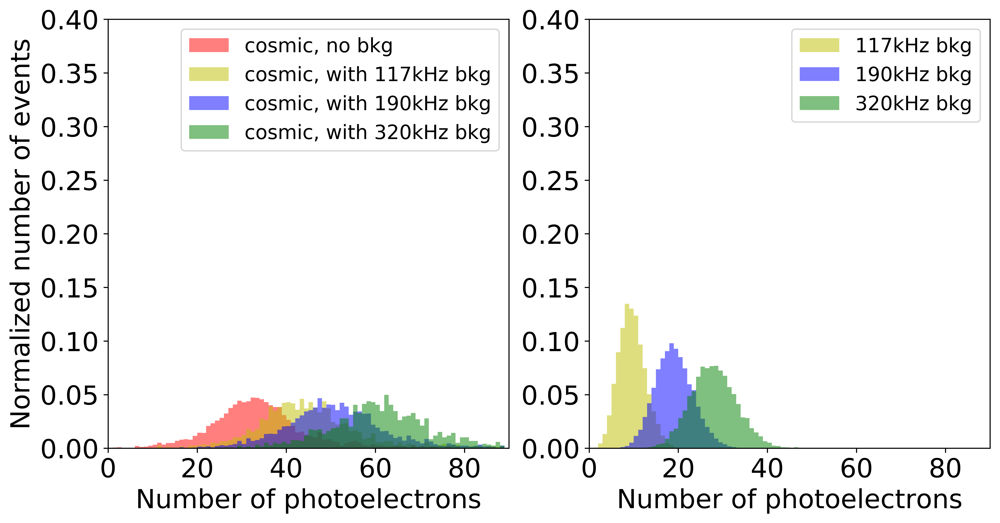

In [20]:
fig, axs = plt.subplots(1,2,figsize=(12,6))
        
hist_cos_pixel_sigraw_new = axs[0].hist(npe_cos_pixel_sigraw_new[:,0], bins=np.arange(90), alpha=0.5, density=True, color='r', label='cosmic, no bkg')
hist_cos_pixel_sig117_new = axs[0].hist(npe_cos_pixel_sig117_new[:,0], bins=np.arange(90), alpha=0.5, density=True, color='y', label='cosmic, with 117kHz bkg')
hist_cos_pixel_sig190_new = axs[0].hist(npe_cos_pixel_sig190_new[:,0], bins=np.arange(90), alpha=0.5, density=True, color='b', label='cosmic, with 190kHz bkg')
hist_cos_pixel_sig320_new = axs[0].hist(npe_cos_pixel_sig320_new[:,0], bins=np.arange(90), alpha=0.5, density=True, color='g', label='cosmic, with 320kHz bkg')

hist_cos_pixel_bkg117_new = axs[1].hist(npe_cos_pixel_bkg117_new[:,0], bins=np.arange(90), alpha=0.5, density=True, color='y', label='117kHz bkg')
hist_cos_pixel_bkg190_new = axs[1].hist(npe_cos_pixel_bkg190_new[:,0], bins=np.arange(90), alpha=0.5, density=True, color='b', label='190kHz bkg')
hist_cos_pixel_bkg320_new = axs[1].hist(npe_cos_pixel_bkg320_new[:,0], bins=np.arange(90), alpha=0.5, density=True, color='g', label='320kHz bkg')

#fig.suptitle("NPE distribution, cosmic muon signal, new setting, pixel readout",fontsize=20)
for i in range(2):
    axs[i].legend(fontsize=15)
    axs[i].set_xlabel("Number of photoelectrons",fontsize=20)
    axs[0].set_ylabel("Normalized number of events",fontsize=20)
    axs[i].set_xlim([0,90])
    axs[i].set_ylim([0,0.4])
    axs[i].tick_params(labelsize=20)
plt.savefig('npe_cos_new_pixel_dist.png')

In [21]:
fig, axs = plt.subplots(2,3,figsize=(20,10))

hist_cos_pixel_sig117_new = axs[0,0].hist(npe_cos_pixel_sig117_new[:,0], bins=np.arange(90), alpha=0.5, density=True, color='b', label='cosmic, with 117kHz bkg')
hist_cos_pixel_bkg117_new = axs[0,0].hist(npe_cos_pixel_bkg117_new[:,0], bins=np.arange(90), alpha=0.5, density=True, color='g', label='117kHz bkg')
hist_cos_pixel_sig190_new = axs[0,1].hist(npe_cos_pixel_sig190_new[:,0], bins=np.arange(90), alpha=0.5, density=True, color='b', label='cosmic, with 190kHz bkg')
hist_cos_pixel_bkg190_new = axs[0,1].hist(npe_cos_pixel_bkg190_new[:,0], bins=np.arange(90), alpha=0.5, density=True, color='g', label='190kHz bkg')
hist_cos_pixel_sig320_new = axs[0,2].hist(npe_cos_pixel_sig320_new[:,0], bins=np.arange(90), alpha=0.5, density=True, color='b', label='cosmic, with 320kHz bkg')
hist_cos_pixel_bkg320_new = axs[0,2].hist(npe_cos_pixel_bkg320_new[:,0], bins=np.arange(90), alpha=0.5, density=True, color='g', label='320kHz bkg')


axs[1,0].plot(1-np.cumsum(hist_cos_pixel_sig117_new[0]),color='b', label='cosmic signal, with 117kHz bkg')
axs[1,0].plot(np.cumsum(hist_cos_pixel_bkg117_new[0]),color='g', label='117kHz bkg')
axs[1,0].scatter(16,1, color='r', label="100%")
axs[1,1].plot(1-np.cumsum(hist_cos_pixel_sig190_new[0]),color='b', label='cosmic signal, with 190kHz bkg')
axs[1,1].plot(np.cumsum(hist_cos_pixel_bkg190_new[0]),color='g', label='190kHz bkg')
axs[1,1].scatter(27,0.98, color='r', label="98%")
axs[1,2].plot(1-np.cumsum(hist_cos_pixel_sig320_new[0]),color='b', label='cosmic signal, with 320kHz bkg')
axs[1,2].plot(np.cumsum(hist_cos_pixel_bkg320_new[0]),color='g', label='320kHz bkg')
axs[1,2].scatter(37.5,0.97, color='r', label="97%")

#fig.suptitle("NPE cut, cosmic muon signal, new setting, pixel readout",fontsize=20)
for i in range(3):
    axs[0,i].legend(fontsize=15)
    axs[0,i].set_xlabel("Number of photoelectrons",fontsize=20)
    axs[0,0].set_ylabel("Normalized number of events",fontsize=20)
    axs[0,i].set_xlim([0,90])
    axs[0,i].set_ylim([0,0.4])
    axs[0,i].tick_params(labelsize=20)
for i in range(3):
    axs[1,i].legend(fontsize=15)
    axs[1,i].set_xlabel("NPE cut",fontsize=20)
    axs[1,0].set_ylabel("Accuracy",fontsize=20)
    axs[1,i].set_xlim([0,90])
    axs[1,i].set_ylim([0,1])
    axs[1,i].tick_params(labelsize=20)
plt.savefig('npe_cos_new_pixel_accuracy.png')

1000V (with new setting)

In [22]:
npe_cos_pixel_sigraw_1000v = train_npe_cos_pixel("data/benchtest/pixel/lucite_run1_pixel_1000V.ml")
npe_cos_pixel_sig150_1000v = train_npe_cos_pixel("data/benchtest/pixel/lucite_bgLED_newSetting_150khz_pixel_1000V.ml")
npe_cos_pixel_sig230_1000v = train_npe_cos_pixel("data/benchtest/pixel/lucite_bgLED_newSetting_230khz_pixel_1000V.ml")
npe_cos_pixel_sig360_1000v = train_npe_cos_pixel("data/benchtest/pixel/lucite_bgLED_newSetting_360khz_pixel_1000V.ml")
npe_cos_pixel_bkg150_1000v = train_npe_cos_pixel("data/benchtest/pixel/bgLED_newSetting150_run2449_pixel_cosmic_1000V.ml")
npe_cos_pixel_bkg230_1000v = train_npe_cos_pixel("data/benchtest/pixel/bgLED_newSetting230_run2444_pixel_cosmic_1000V.ml")
npe_cos_pixel_bkg360_1000v = train_npe_cos_pixel("data/benchtest/pixel/bgLED_newSetting360_run2437_pixel_cosmic_1000V.ml")

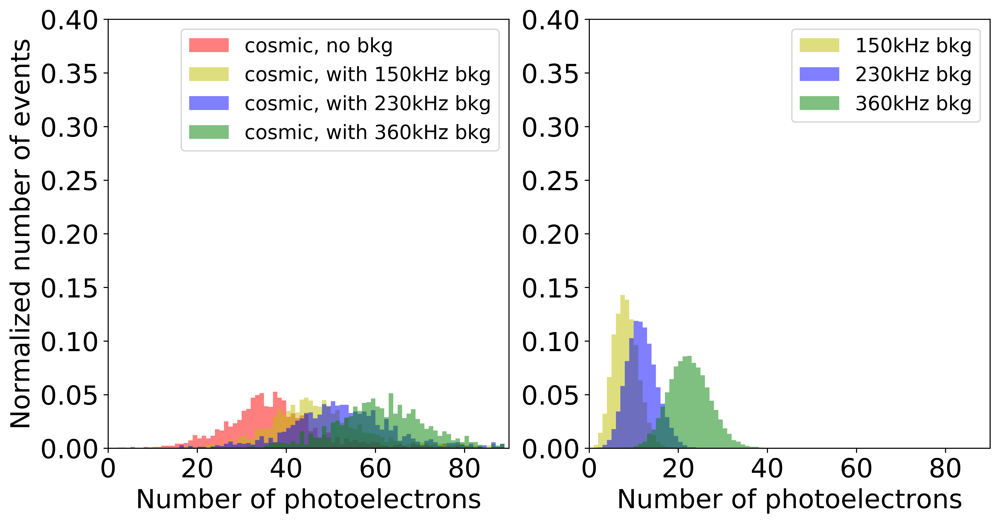

In [23]:
fig, axs = plt.subplots(1,2,figsize=(12,6))
        
hist_cos_pixel_sigraw_1000v = axs[0].hist(npe_cos_pixel_sigraw_1000v[:,0], bins=np.arange(90), alpha=0.5, density=True, color='r', label='cosmic, no bkg')
hist_cos_pixel_sig150_1000v = axs[0].hist(npe_cos_pixel_sig150_1000v[:,0], bins=np.arange(90), alpha=0.5, density=True, color='y', label='cosmic, with 150kHz bkg')
hist_cos_pixel_sig230_1000v = axs[0].hist(npe_cos_pixel_sig230_1000v[:,0], bins=np.arange(90), alpha=0.5, density=True, color='b', label='cosmic, with 230kHz bkg')
hist_cos_pixel_sig360_1000v = axs[0].hist(npe_cos_pixel_sig360_1000v[:,0], bins=np.arange(90), alpha=0.5, density=True, color='g', label='cosmic, with 360kHz bkg')
hist_cos_pixel_bkg150_1000v = axs[1].hist(npe_cos_pixel_bkg150_1000v[:,0], bins=np.arange(90), alpha=0.5, density=True, color='y', label='150kHz bkg')
hist_cos_pixel_bkg230_1000v = axs[1].hist(npe_cos_pixel_bkg230_1000v[:,0], bins=np.arange(90), alpha=0.5, density=True, color='b', label='230kHz bkg')
hist_cos_pixel_bkg360_1000v = axs[1].hist(npe_cos_pixel_bkg360_1000v[:,0], bins=np.arange(90), alpha=0.5, density=True, color='g', label='360kHz bkg')

#fig.suptitle("NPE distribution, Cosmic muon signal, 1000V (new setting), pixel readout",fontsize=20)
for i in range(2):
    axs[i].legend(fontsize=15)
    axs[i].set_xlabel("Number of photoelectrons",fontsize=20)
    axs[0].set_ylabel("Normalized number of events",fontsize=20)
    axs[i].set_xlim([0,90])
    axs[i].set_ylim([0,0.4])
    axs[i].tick_params(labelsize=20)
plt.savefig('npe_cos_1000_pixel_dist.png')

In [24]:
fig, axs = plt.subplots(2,3,figsize=(20,10))

hist_cos_pixel_sig150_1000v = axs[0,0].hist(npe_cos_pixel_sig150_1000v[:,0], bins=np.arange(90), alpha=0.5, density=True, color='b', label='cosmic, with 150kHz bkg')
hist_cos_pixel_bkg150_1000v = axs[0,0].hist(npe_cos_pixel_bkg150_1000v[:,0], bins=np.arange(90), alpha=0.5, density=True, color='g', label='150kHz bkg')

hist_cos_pixel_sig230_1000v = axs[0,1].hist(npe_cos_pixel_sig230_1000v[:,0], bins=np.arange(90), alpha=0.5, density=True, color='b', label='cosmic, with 230kHz bkg')
hist_cos_pixel_bkg230_1000v = axs[0,1].hist(npe_cos_pixel_bkg230_1000v[:,0], bins=np.arange(90), alpha=0.5, density=True, color='g', label='230kHz bkg')

hist_cos_pixel_sig360_1000v = axs[0,2].hist(npe_cos_pixel_sig360_1000v[:,0], bins=np.arange(90), alpha=0.5, density=True, color='b', label='cosmic, with 360kHz bkg')
hist_cos_pixel_bkg360_1000v = axs[0,2].hist(npe_cos_pixel_bkg360_1000v[:,0], bins=np.arange(90), alpha=0.5, density=True, color='g', label='360kHz bkg')

axs[1,0].plot(1-np.cumsum(hist_cos_pixel_sig150_1000v[0]),color='b', label='cosmic signal, with 150kHz bkg')
axs[1,0].plot(np.cumsum(hist_cos_pixel_bkg150_1000v[0]),color='g', label='150kHz bkg')
axs[1,0].scatter(15,1, color='r', label="100%")

axs[1,1].plot(1-np.cumsum(hist_cos_pixel_sig230_1000v[0]),color='b', label='cosmic signal, with 230kHz bkg')
axs[1,1].plot(np.cumsum(hist_cos_pixel_bkg230_1000v[0]),color='g', label='230kHz bkg')
axs[1,1].scatter(20,0.99, color='r', label="99%")

axs[1,2].plot(1-np.cumsum(hist_cos_pixel_sig360_1000v[0]),color='b', label='cosmic signal, with 360kHz bkg')
axs[1,2].plot(np.cumsum(hist_cos_pixel_bkg360_1000v[0]),color='g', label='360kHz bkg')
axs[1,2].scatter(33,0.99, color='r', label="99%")

#fig.suptitle("NPE cut, cosmic muon signal, 1000V (new setting), pixel readout",fontsize=20)
for i in range(3):
    axs[0,i].legend(fontsize=15)
    axs[0,i].set_xlabel("Number of photoelectrons",fontsize=20)
    axs[0,0].set_ylabel("Normalized number of events",fontsize=20)
    axs[0,i].set_xlim([0,90])
    axs[0,i].set_ylim([0,0.4])
    axs[0,i].tick_params(labelsize=20)
for i in range(3):
    axs[1,i].legend(fontsize=15)
    axs[1,i].set_xlabel("NPE cut",fontsize=20)
    axs[1,0].set_ylabel("Accuracy",fontsize=20)
    axs[1,i].set_xlim([0,90])
    axs[1,i].set_ylim([0,1])
    axs[1,i].tick_params(labelsize=20)
plt.savefig('npe_cos_1000_pixel_accuracy.png')

## train, npe, cosmic, fadc/quad readout

In [34]:
def train_npe_cosmic_quad(input_name):
    file_input = open(input_name)
    npe = np.empty(0)
    
    line = file_input.readline()
    while(line):
        quad = quad_conversion(np.fromstring(line, sep="\t",dtype=float)[1:])
        pmt = quad_to_pmt(quad)
        results = np.array([quad.sum(), quad.nonzero()[0].size, pmt.nonzero()[0].size])
        
        if npe.size>0:
            npe = np.vstack((npe, results))
        else:
            npe = results
        line = file_input.readline()
        
    file_input.close()
    return npe

In [35]:
npe_cosmic_quad_sigraw = train_npe_cosmic_quad("data/benchtest/newSetting/lucite_newSetting_2396_fadc.ml")
npe_cosmic_quad_sig117 = train_npe_cosmic_quad("data/benchtest/newSetting/lucite_bgLED_newSetting_117khz_2464_fadc.ml")
npe_cosmic_quad_sig190 = train_npe_cosmic_quad("data/benchtest/newSetting/lucite_bgLED_newSetting_190khz_2456_fadc.ml")
npe_cosmic_quad_sig320 = train_npe_cosmic_quad("data/benchtest/newSetting/lucite_bgLED_newSetting_320khz_2422_fadc.ml")
npe_cosmic_quad_bkg117 = train_npe_cosmic_quad("data/benchtest/fadc/bgLED_117_run2460_fadc_cosmic.ml")
npe_cosmic_quad_bkg190 = train_npe_cosmic_quad("data/benchtest/fadc/bgLED_190_run2454_fadc_cosmic.ml")
npe_cosmic_quad_bkg320 = train_npe_cosmic_quad("data/benchtest/fadc/bgLED_320_run2427_fadc_cosmic.ml")

FileNotFoundError: [Errno 2] No such file or directory: 'data/benchtest/newSetting/lucite_newSetting_2396_fadc.ml'

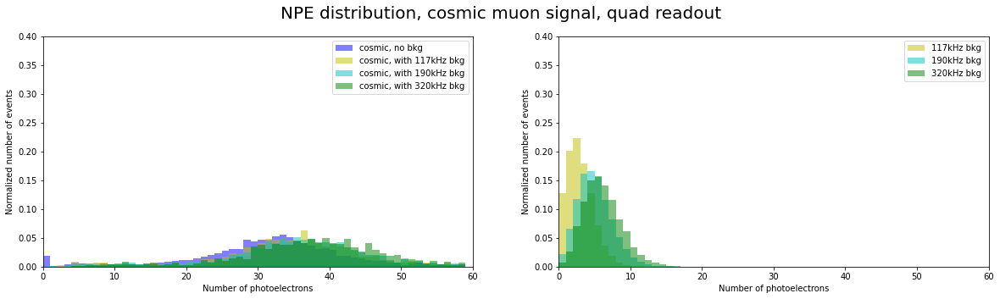

In [197]:
fig, axs = plt.subplots(1,2,figsize=(20,5))
        
hist_cosmic_quad_sigraw = axs[0].hist(npe_cosmic_quad_sigraw[:,0], bins=np.arange(60), alpha=0.5, density=True, color='r', label='cosmic, no bkg')
hist_cosmic_quad_sig117 = axs[0].hist(npe_cosmic_quad_sig117[:,0], bins=np.arange(60), alpha=0.5, density=True, color='y', label='cosmic, with 117kHz bkg')
hist_cosmic_quad_sig190 = axs[0].hist(npe_cosmic_quad_sig190[:,0], bins=np.arange(60), alpha=0.5, density=True, color='b', label='cosmic, with 190kHz bkg')
hist_cosmic_quad_sig320 = axs[0].hist(npe_cosmic_quad_sig320[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='cosmic, with 320kHz bkg')

hist_cosmic_quad_bkg117 = axs[1].hist(npe_cosmic_quad_bkg117[:,0], bins=np.arange(60), alpha=0.5, density=True, color='y', label='117kHz bkg')
hist_cosmic_quad_bkg190 = axs[1].hist(npe_cosmic_quad_bkg190[:,0], bins=np.arange(60), alpha=0.5, density=True, color='b', label='190kHz bkg')
hist_cosmic_quad_bkg320 = axs[1].hist(npe_cosmic_quad_bkg320[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='320kHz bkg')

fig.suptitle("NPE distribution, cosmic muon signal, quad readout",fontsize=20)
for i in range(2):
    axs[i].legend(fontsize=10)
    axs[i].set_xlabel("Number of photoelectrons")
    axs[i].set_ylabel("Normalized number of events")
    axs[i].set_xlim([0,60])
    axs[i].set_ylim([0,0.4])

In [ ]:
fig, axs = plt.subplots(2,3,figsize=(20,10))

hist_led_quad_sig65 = axs[0,0].hist(npe_led_quad_sig65[:,0], bins=np.arange(60), alpha=0.5, density=True, color='b', label='LED, with 65kHz bkg')
hist_led_quad_bkg65 = axs[0,0].hist(npe_led_quad_bkg65[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='65kHz bkg')

hist_led_quad_sig180 = axs[0,1].hist(npe_led_quad_sig180[:,0], bins=np.arange(60), alpha=0.5, density=True, color='b', label='LED, with 180kHz bkg')
hist_led_quad_bkg180 = axs[0,1].hist(npe_led_quad_bkg180[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='180kHz bkg')

hist_led_quad_sig370 = axs[0,2].hist(npe_led_quad_sig370[:,0], bins=np.arange(60), alpha=0.5, density=True, color='b', label='LED, with 370kHz bkg')
hist_led_quad_bkg370 = axs[0,2].hist(npe_led_quad_bkg370[:,0], bins=np.arange(60), alpha=0.5, density=True, color='g', label='370kHz bkg')

axs[1,0].plot(1-np.cumsum(hist_led_quad_sig65[0]),color='b', label='LED signal, with 65kHz bkg')
axs[1,0].plot(np.cumsum(hist_led_quad_bkg65[0]),color='g', label='65kHz bkg')
axs[1,0].scatter(3,1, color='r', label="100%")

axs[1,1].plot(1-np.cumsum(hist_led_quad_sig180[0]),color='b', label='LED signal, with 180kHz bkg')
axs[1,1].plot(np.cumsum(hist_led_quad_bkg180[0]),color='g', label='180kHz bkg')
axs[1,1].scatter(15,1, color='r', label="100%")

axs[1,2].plot(1-np.cumsum(hist_led_quad_sig370[0]),color='b', label='LED signal, with 370kHz bkg')
axs[1,2].plot(np.cumsum(hist_led_quad_bkg370[0]),color='g', label='370kHz bkg')
axs[1,2].scatter(19.75,0.985, color='r', label="98.5%")

fig.suptitle("NPE cut, LED ring signal, quad readout",fontsize=20)
for i in range(3):
    axs[0,i].legend(fontsize=10)
    axs[0,i].set_xlabel("Number of photoelectrons")
    axs[0,i].set_ylabel("Normalized number of events")
    axs[0,i].set_xlim([0,60])
    axs[0,i].set_ylim([0,0.4])
for i in range(3):
    axs[1,i].legend(fontsize=10)
    axs[1,i].set_xlabel("NPE cut")
    axs[1,i].set_ylabel("Accuracy")
    axs[1,i].set_xlim([0,60])
    axs[1,i].set_ylim([0,1])

array([ 0.09517172, 19.30563241,  4.18756034])

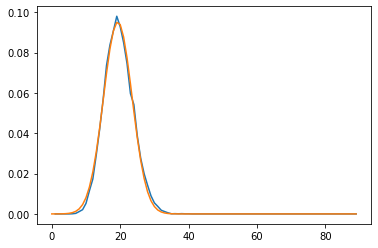

In [203]:
current = hist_cos_pixel_bkg190_new
paras = gaussian_fit(current[1][1:], current[0])
plt.plot(current[1][1:], current[0])
x = np.arange(90)
y = np.zeros(90)
for i in range(90):
    y[i] = gaussian(x[i], paras[0], paras[1], paras[2])
plt.plot(x,y)
paras